In [9]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import butter, lfilter, lfilter_zi

In [43]:
import pandas as pd

# Leer el archivo de texto ignorando las líneas de metadata
with open('OpenBCISession_ojos_abiertos_5min/OpenBCI-RAW-2024-06-26_16-29-22.txt', 'r') as file:
    lines = file.readlines()

# Filtrar las líneas que no empiezan con '%'
data_lines = [line for line in lines if not line.startswith('%')]

# Crear un DataFrame a partir de las líneas de datos
data = pd.DataFrame([line.strip().split(',') for line in data_lines])

# Renombrar las columnas
data.columns = [
    'Sample Index', 'EXG Channel 0', 'EXG Channel 1', 'EXG Channel 2', 
    'EXG Channel 3', 'EXG Channel 4', 'EXG Channel 5', 'EXG Channel 6', 
    'EXG Channel 7', 'EXG Channel 8', 'EXG Channel 9', 'EXG Channel 10', 
    'EXG Channel 11', 'EXG Channel 12', 'EXG Channel 13', 'EXG Channel 14', 
    'EXG Channel 15', 'Accel Channel 0', 'Accel Channel 1', 'Accel Channel 2', 
    'Other 0', 'Other 1', 'Other 2', 'Other 3', 'Other 4', 'Other 5', 'Other 6', 
    'Analog Channel 0', 'Analog Channel 1', 'Analog Channel 2', 'Timestamp', 
    'Other 7', 'Timestamp (Formatted)'
]

# Seleccionar las columnas de interés (EXG Channel 0 a EXG Channel 15)
selected_columns = ['EXG Channel {}'.format(i) for i in range(16)]

# Crear un nuevo DataFrame solo con las columnas seleccionadas
selected_data = data[selected_columns]

# Eliminar la primera fila con los nombres originales
selected_data = selected_data.iloc[1:].reset_index(drop=True)

# Renombrar las columnas seleccionadas
new_column_names = ['Ch{}'.format(i+1) for i in range(16)]
selected_data.columns = new_column_names

# Guardar el DataFrame en un archivo CSV
selected_data.to_csv('OpenBCISession_5min_ojos_cerrados/EEG_ojos_cerrados.csv', index=False)



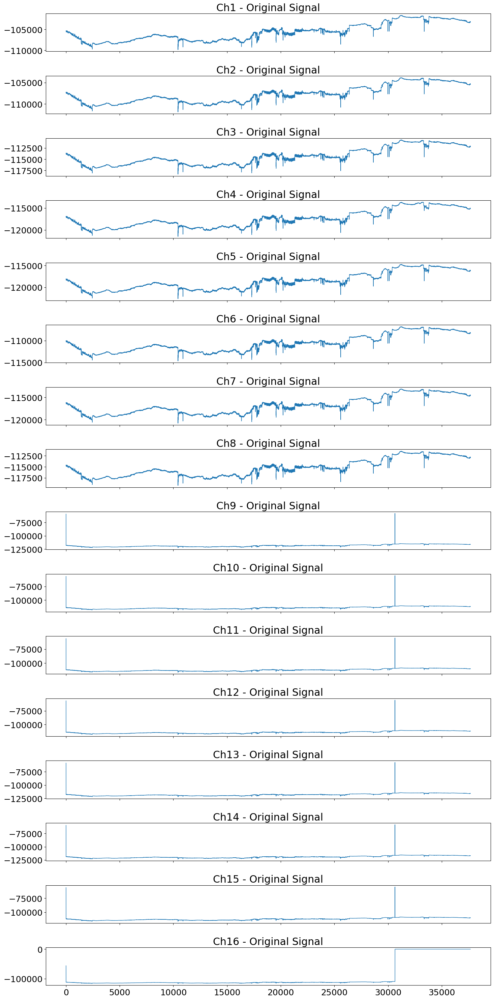

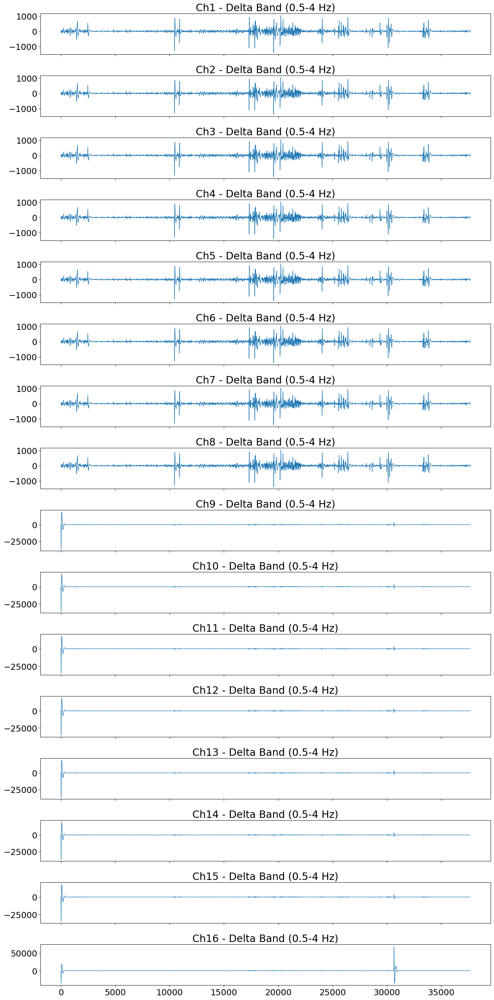

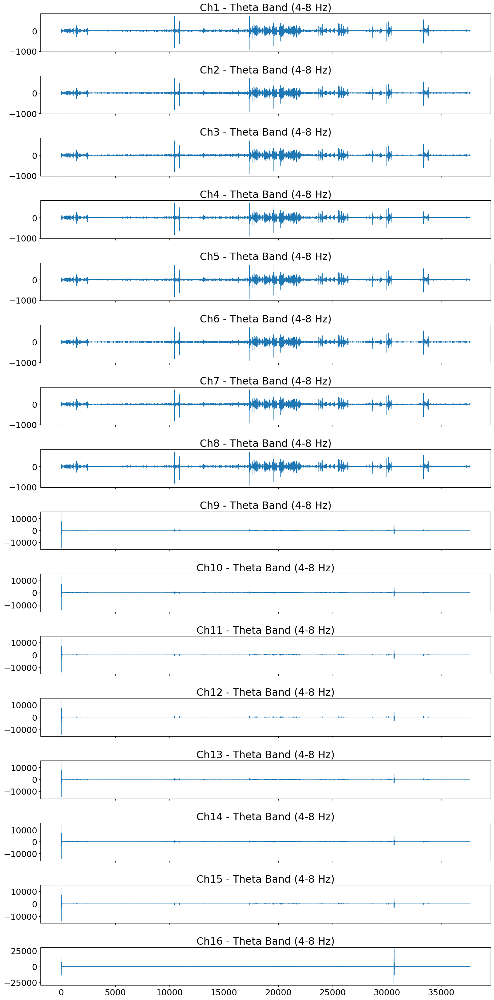

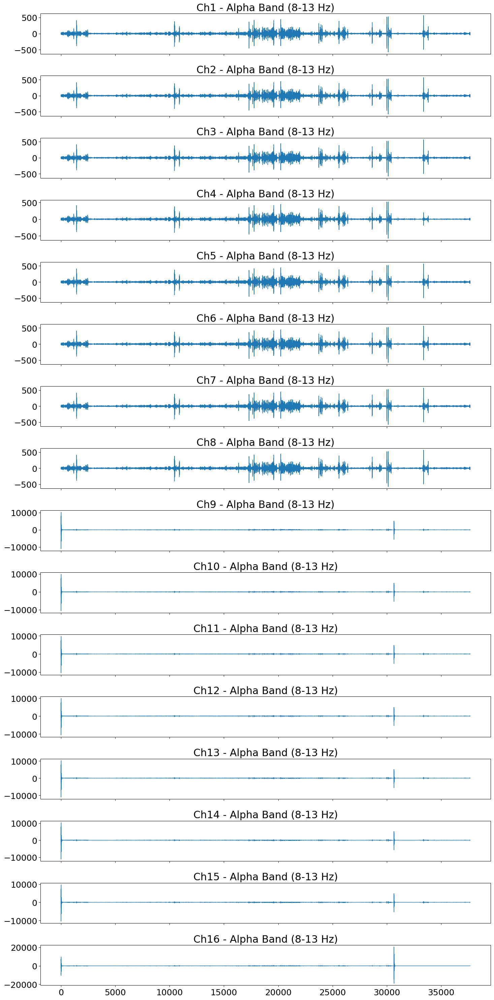

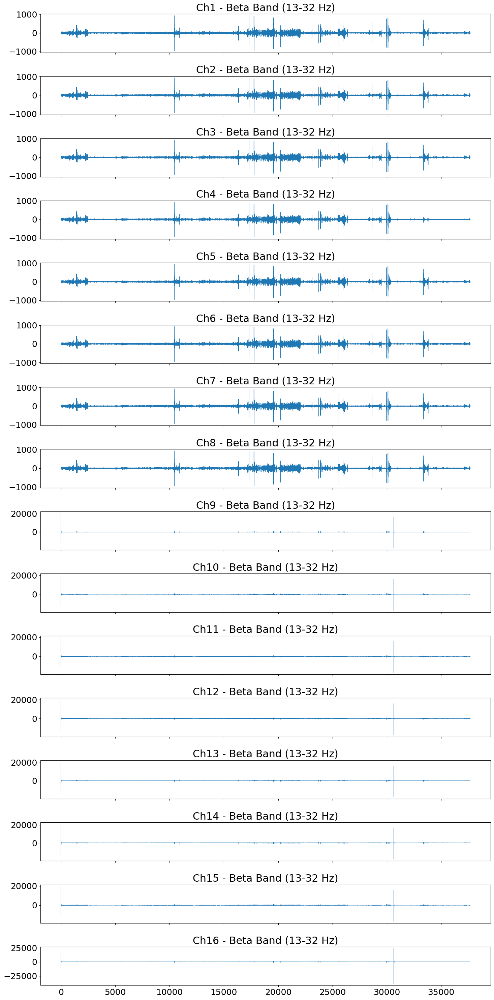

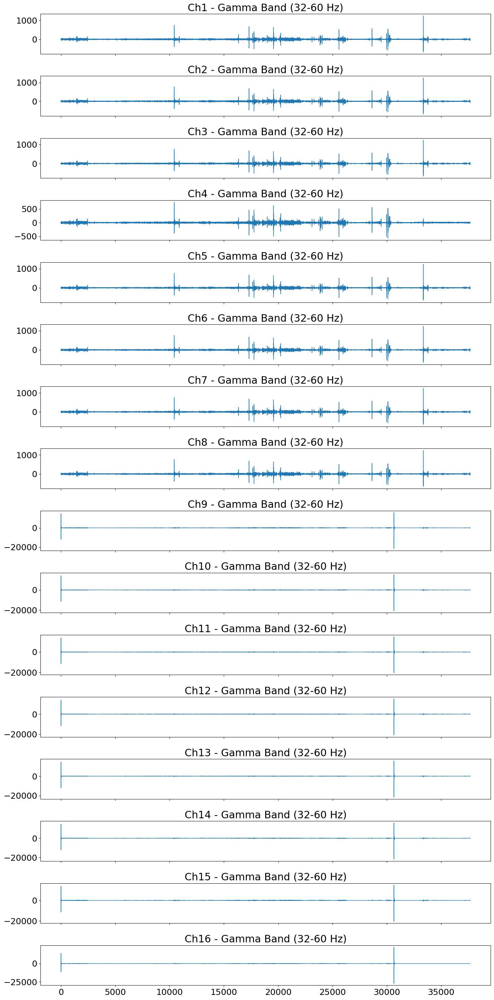

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, lfilter, lfilter_zi

# Butterworth filter functions
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    zi = lfilter_zi(b, a) * data[0]
    y, _ = lfilter(b, a, data, zi=zi)
    return y

# Parameters
sampling_frequency = 125
data_folder = 'OpenBCISession_5min_ojos_cerrados/EEG_ojos_cerrados.csv'
df = pd.read_csv(data_folder)

# Filtering parameters
bands = {
    'Original Signal': None,
    'Delta Band (0.5-4 Hz)': (0.5, 4),
    'Theta Band (4-8 Hz)': (4, 8),
    'Alpha Band (8-13 Hz)': (8, 13),
    'Beta Band (13-32 Hz)': (13, 32),
    'Gamma Band (32-60 Hz)': (32, 60)
}

# Plotting for each band
for title, band in bands.items():
    fig, axes = plt.subplots(16, 1, figsize=(15, 30), sharex=True)
    
    for i, ch in enumerate(df.columns):
        ax = axes[i]
        if band:
            lowcut, highcut = band
            filtered_data = butter_bandpass_filter(data=df[ch], lowcut=lowcut, highcut=highcut, fs=sampling_frequency, order=3)
            ax.plot(filtered_data, linewidth=1)
        else:
            ax.plot(df[ch], linewidth=1)
        ax.set_title(f'{ch} - {title}')
    
    plt.tight_layout()
    plt.show()


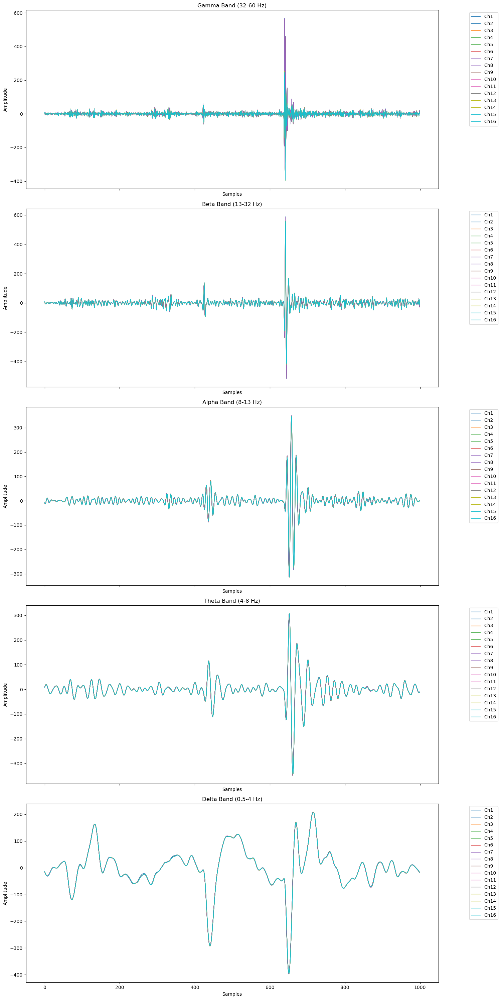

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, lfilter, lfilter_zi
import pywt

# Butterworth filter functions
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    zi = lfilter_zi(b, a) * data[0]
    y, _ = lfilter(b, a, data, zi=zi)
    return y

# Wavelet transform function
def wavelet_transform(data, wavelet='db2'):
    coeffs = pywt.wavedec(data, wavelet, level=5)
    return coeffs

# Parameters
sampling_frequency = 125
data_folder = 'OpenBCISession_5min_ojos_cerrados/EEG_ojos_cerrados.csv'
df = pd.read_csv(data_folder)

# Filtering parameters
bands = {
    'Gamma Band (32-60 Hz)': (32, 60),
    'Beta Band (13-32 Hz)': (13, 32),
    'Alpha Band (8-13 Hz)': (8, 13),
    'Theta Band (4-8 Hz)': (4, 8),
    'Delta Band (0.5-4 Hz)': (0.5, 4),
}

# Create subplots
fig, axs = plt.subplots(len(bands), 1, figsize=(15, 30), sharex=True)

# Plotting for each band
for ax, (title, band) in zip(axs, bands.items()):
    colors = plt.cm.tab10(np.linspace(0, 1, len(df.columns)))  # Generate strong colors for each channel
    
    for i, (ch, color) in enumerate(zip(df.columns, colors)):
        lowcut, highcut = band
        filtered_data = butter_bandpass_filter(data=df[ch], lowcut=lowcut, highcut=highcut, fs=sampling_frequency, order=3)
        
        # Apply wavelet transform
        coeffs = wavelet_transform(filtered_data, wavelet='db2')
        wavelet_reconstruction = pywt.waverec(coeffs, 'db2')
        
        # Plot the wavelet-transformed data
        ax.plot(wavelet_reconstruction[28000:29000], linewidth=1, color=color, label=ch)
    
    ax.set_title(f'{title}')
    ax.set_xlabel('Samples')
    ax.set_ylabel('Amplitude')
    ax.legend(loc='upper right', bbox_to_anchor=(1.15, 1))

plt.tight_layout()
plt.show()

Creating RawArray with float64 data, n_channels=16, n_times=37677
    Range : 0 ... 37676 =      0.000 ...   301.408 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 413 samples (3.304 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenu

/var/folders/p3/57dpvzqj7qdd6ln8hb69_4d80000gn/T/ipykernel_89889/956595622.py:43: RuntimeWarning: Using n_components=16 (resulting in n_components_=16) may lead to an unstable mixing matrix estimation because the ratio between the largest (13) and smallest (1.2e-07) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 4
  ica.fit(raw)


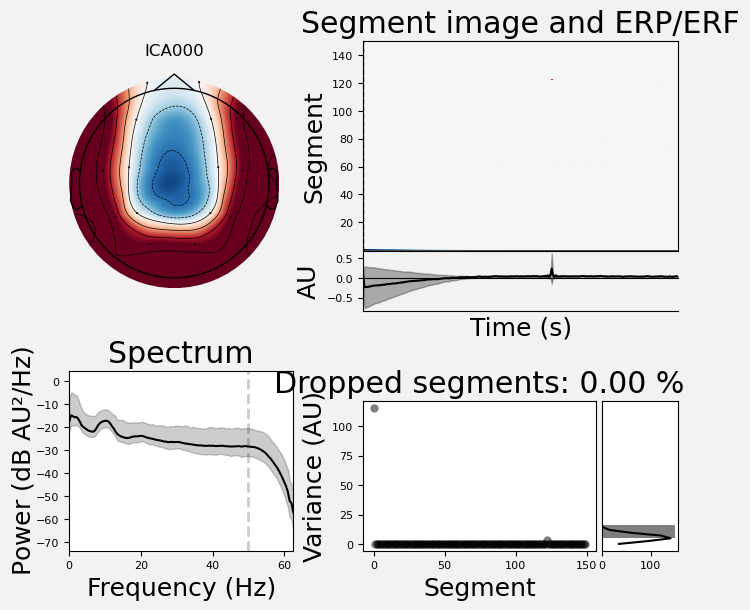

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


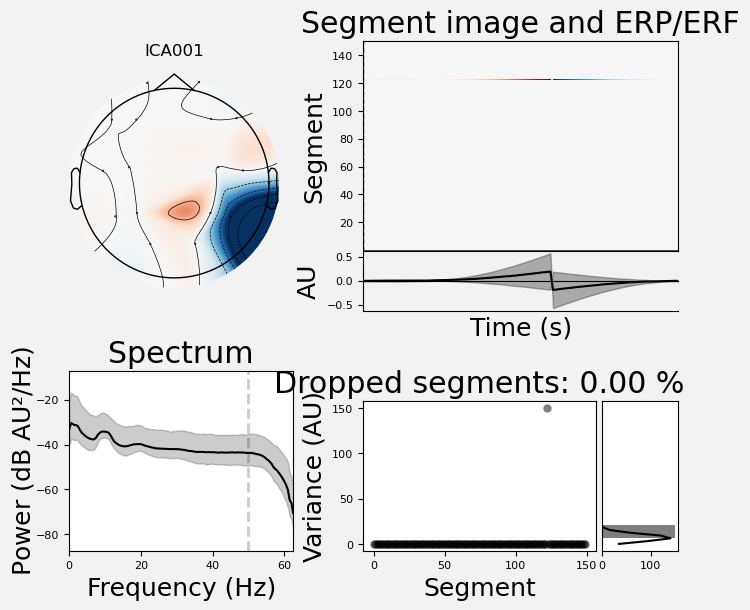

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


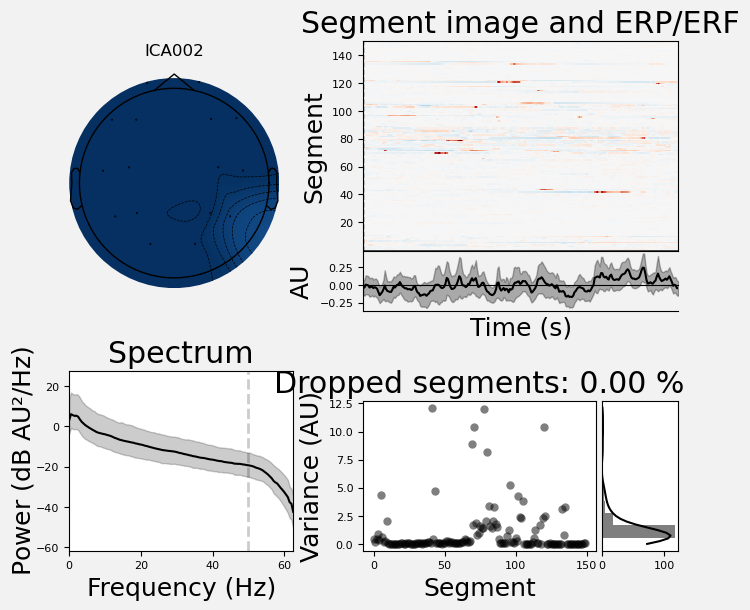

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


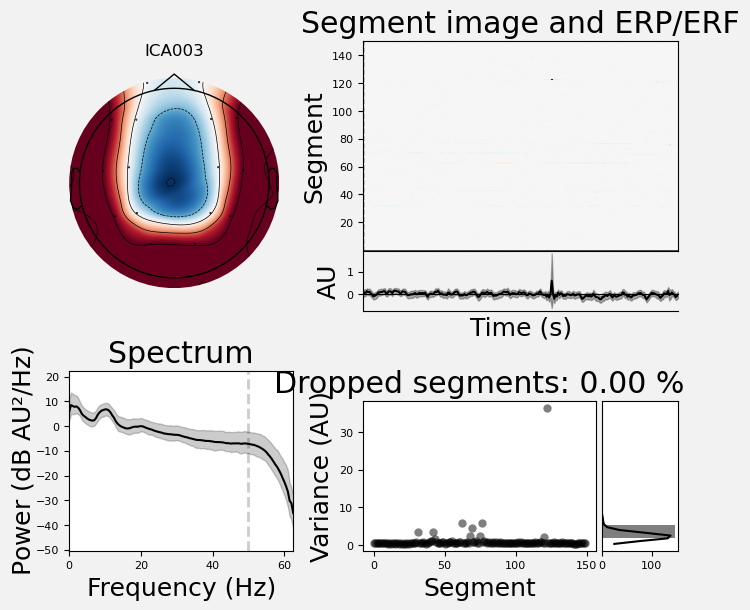

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


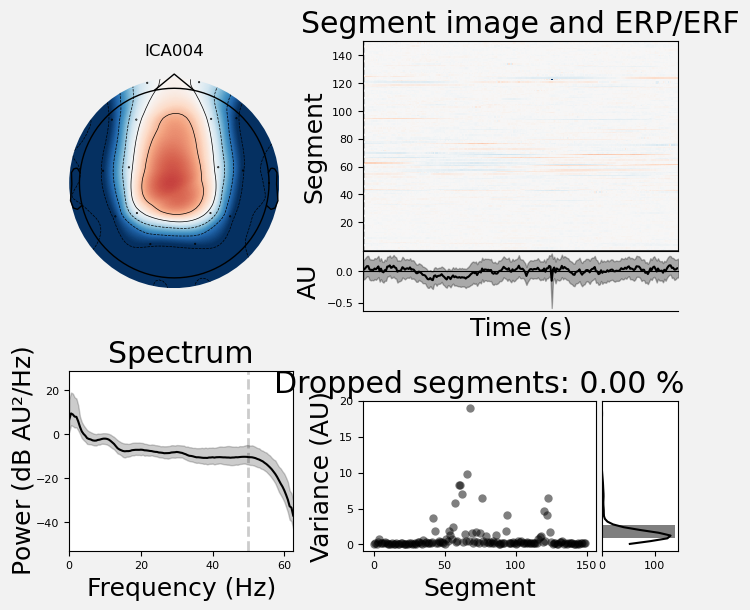

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


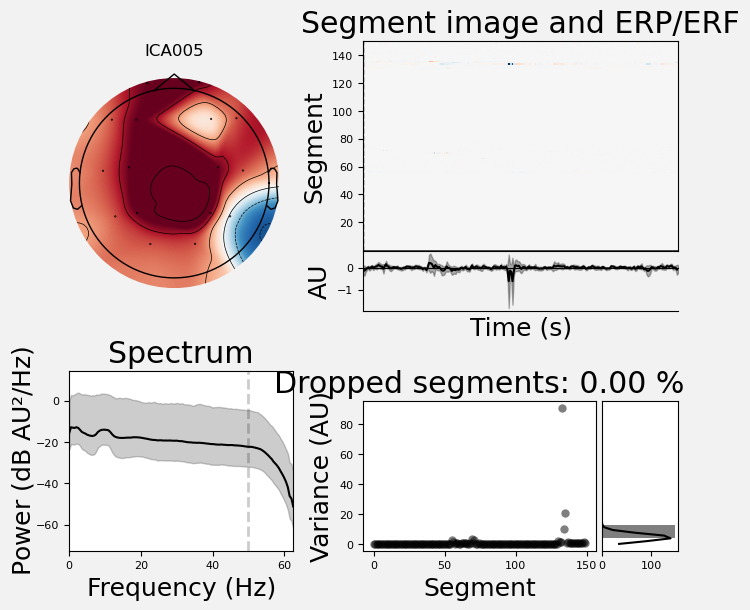

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


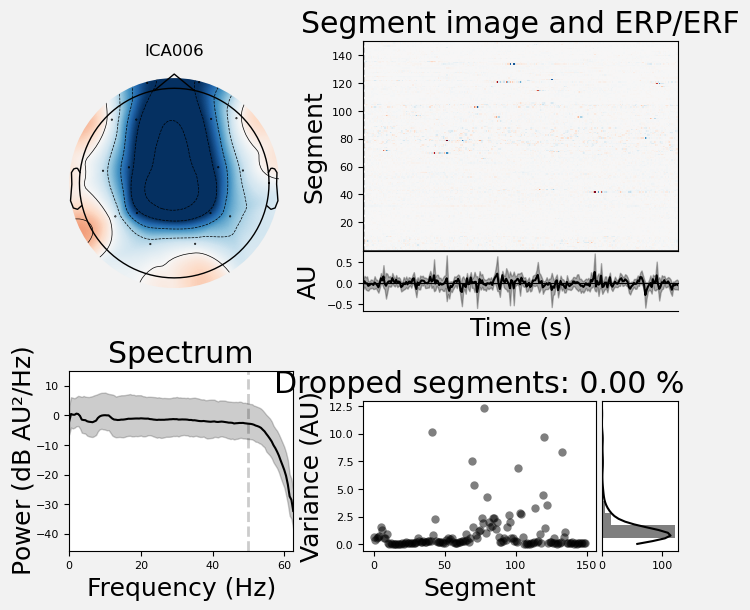

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


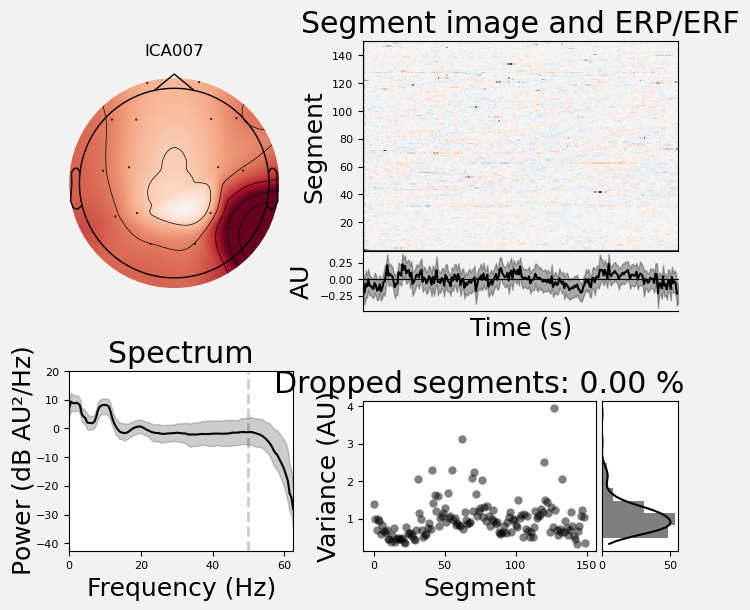

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


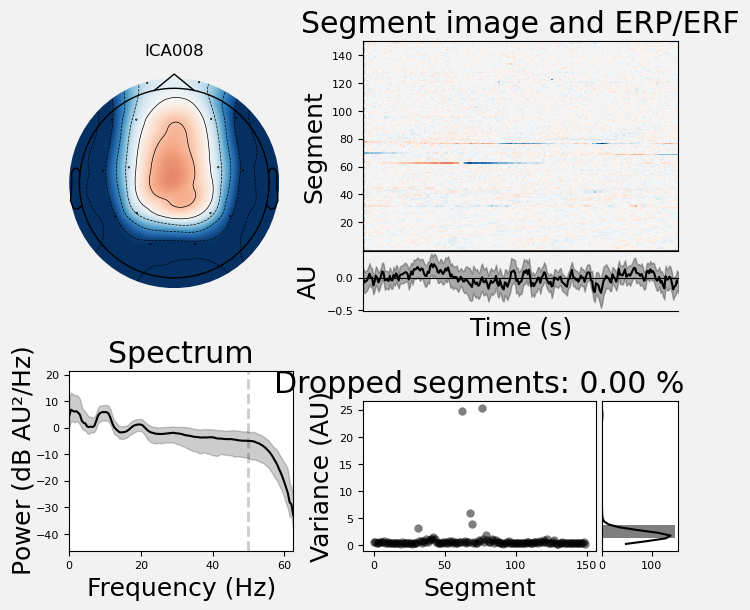

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


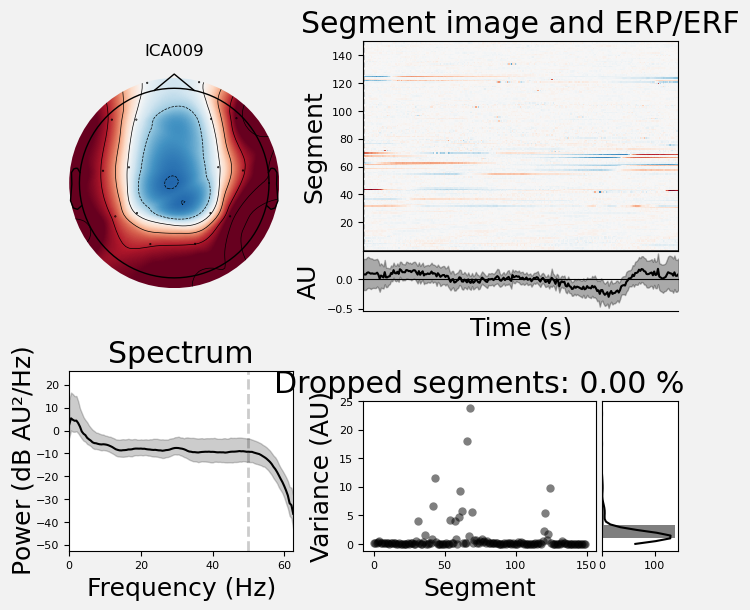

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


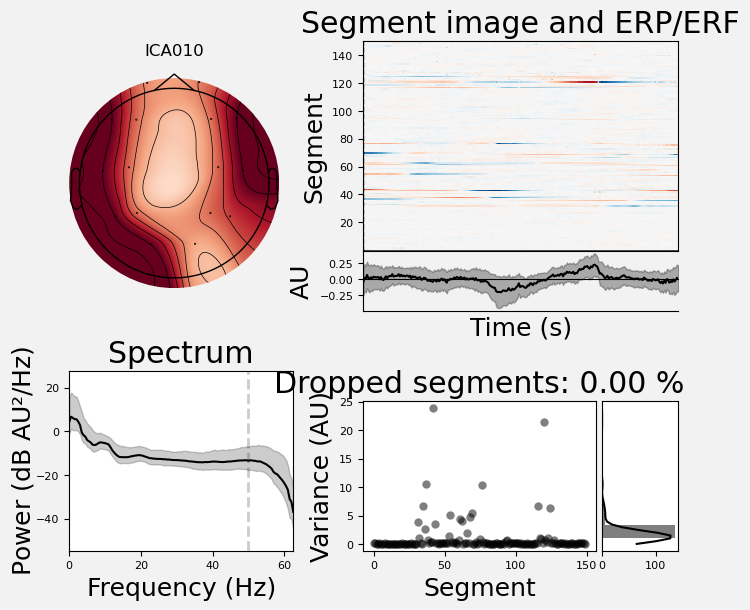

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


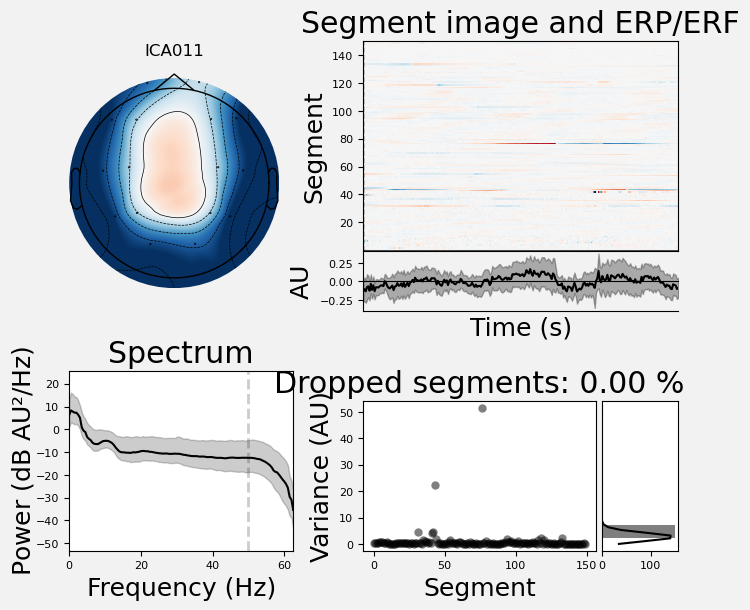

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


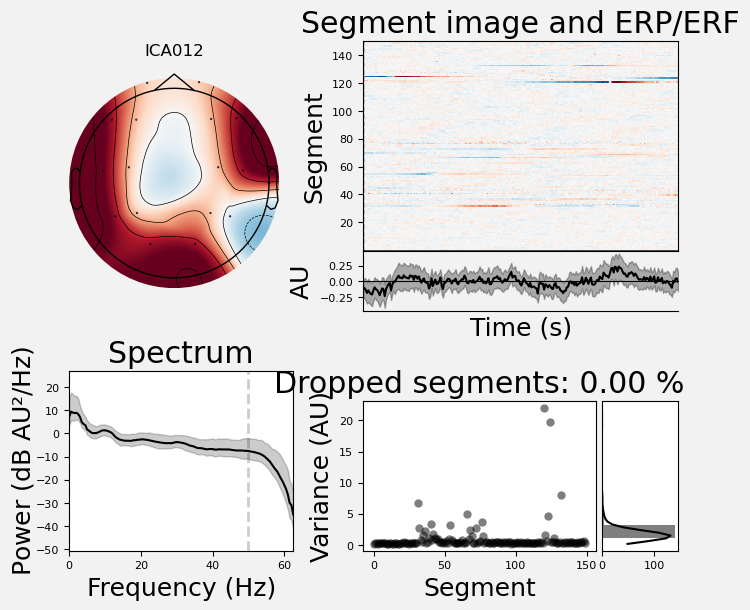

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


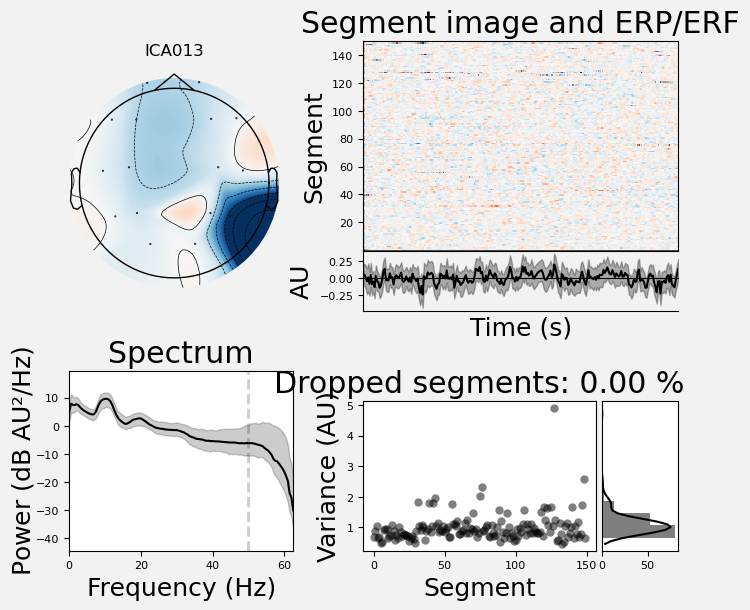

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


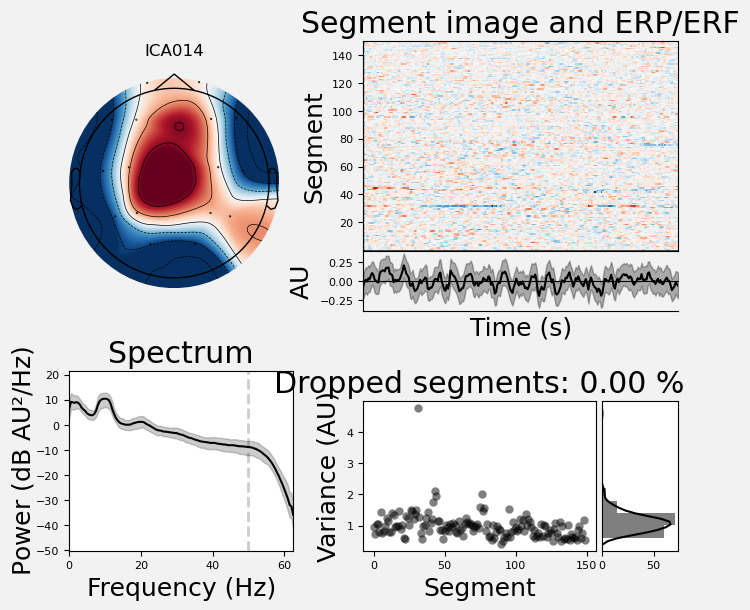

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated


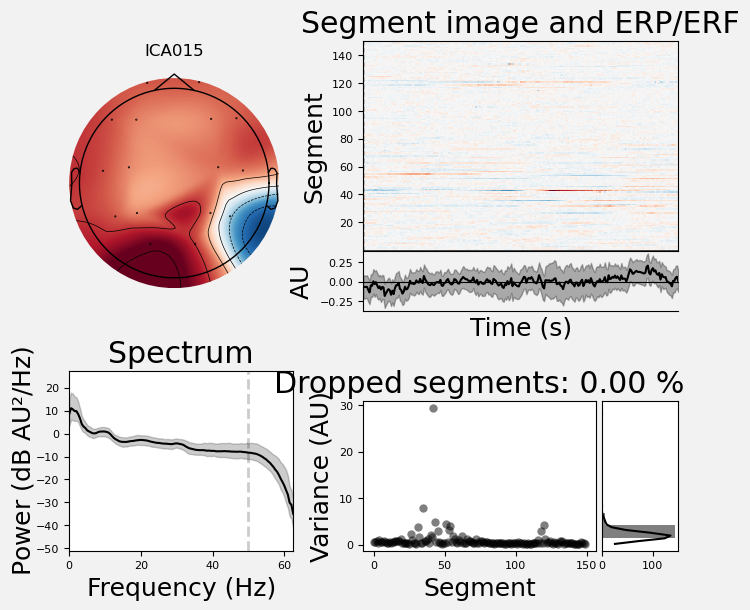

Applying ICA to Raw instance
    Transforming to ICA space (16 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components
Using pyopengl with version 3.1.6
Channels marked as bad:
none
Using pyopengl with version 3.1.6
Channels marked as bad:
none


In [46]:
import mne
from mne.preprocessing import ICA
import pandas as pd
import numpy as np

# Load the data
data_folder = 'OpenBCISession_5min_ojos_cerrados/EEG_ojos_cerrados.csv'
df = pd.read_csv(data_folder)

# Extract channel names from the DataFrame, assuming all columns are EEG channels
ch_names = list(df.columns)

# Sampling frequency
sampling_frequency = 125  # Adjust according to your data

# Create an MNE Info object
info = mne.create_info(ch_names=ch_names, sfreq=sampling_frequency, ch_types=['eeg'] * len(ch_names))

# Create an MNE Raw object
data = df.values.T  # Transpose to get channels as rows
raw = mne.io.RawArray(data, info)

# Map custom channel names to standard 10-20 names
standard_names = [
    'Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2',
    'F7', 'F8', 'T7', 'T8', 'P7', 'P8'
]
rename_mapping = {old: new for old, new in zip(ch_names, standard_names)}
raw.rename_channels(rename_mapping)

# Apply a standard montage (e.g., 10-20 system)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Apply bandpass filter
raw.filter(1, 50, fir_design='firwin')

# Apply notch filter to remove power line noise at 60 Hz
raw.notch_filter(np.arange(60, sampling_frequency / 2, 60), fir_design='firwin')

# Fit ICA with 16 components
ica = ICA(n_components=16, random_state=97, max_iter='auto')
ica.fit(raw)

# Plot properties of the ICA components
for i in range(ica.n_components_):
    ica.plot_properties(raw, picks=i)

# Apply ICA to the raw data
raw_ica = ica.apply(raw.copy())

# Plot the raw data
raw.plot(title='Raw Data', show=True, block=True)

# Plot the ICA-cleaned data
raw_ica.plot(title='ICA Cleaned Data', show=True, block=True)


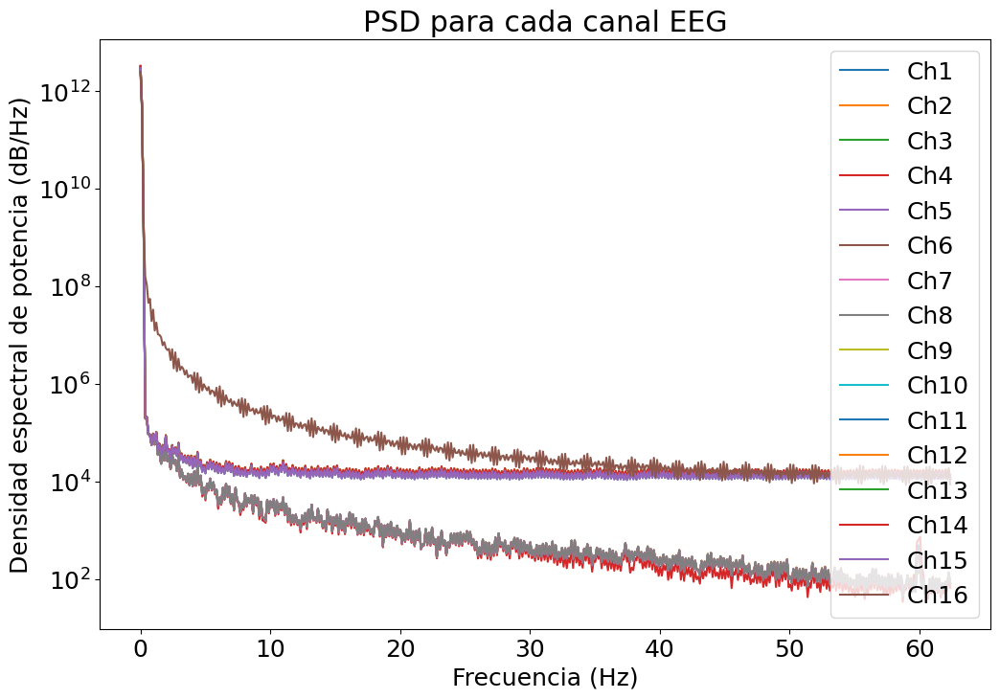

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import get_window, firwin
from scipy.fft import fft

def modified_welch(signal, fs, window='hamming', nperseg=1024):
    # Segmentar la señal en bloques no superpuestos
    step = nperseg // 2
    segments = [signal[i:i+nperseg] for i in range(0, len(signal)-nperseg+1, step)]
    
    # Aplicar ventana en el dominio del tiempo
    win = get_window(window, nperseg)
    windowed_segments = [segment * win for segment in segments]
    
    # Calcular FFTs de los segmentos no superpuestos
    fft_segments = [fft(segment) for segment in windowed_segments]
    
    # Combinación de FFTs para segmentos superpuestos
    combined_fft_segments = []
    for i in range(len(fft_segments) - 1):
        combined_fft = (fft_segments[i] + fft_segments[i+1]) / 2
        combined_fft_segments.append(combined_fft)
    
    # Aplicar ventana en el dominio de la frecuencia
    freq_win = firwin(3, 0.5, window='hamming')
    freq_windowed_segments = [np.convolve(segment, freq_win, mode='same') for segment in combined_fft_segments]
    
    # Calcular el periodograma modificado
    periodograms = [np.abs(segment)**2 / nperseg for segment in freq_windowed_segments]
    
    # Promediar los periodogramas
    Pxx = np.mean(periodograms, axis=0)
    
    freqs = np.fft.fftfreq(nperseg, 1/fs)
    return freqs[:nperseg//2], Pxx[:nperseg//2]

# Cargar los datos EEG desde el archivo CSV
data_folder = 'OpenBCISession_5min_ojos_cerrados/EEG_ojos_cerrados.csv'
df = pd.read_csv(data_folder)

# Frecuencia de muestreo
fs = 125  # Hz

# Iterar sobre cada canal y calcular la PSD modificada
plt.figure(figsize=(12, 8))
for column in df.columns:
    signal = df[column].values  # Obtener la señal del canal actual
    f, Pxx = modified_welch(signal, fs)
    plt.semilogy(f, Pxx, label=column)

plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Densidad espectral de potencia (dB/Hz)')
plt.title('PSD para cada canal EEG')
plt.legend()
plt.show()


In [55]:
from scipy.signal import find_peaks
from scipy.stats import entropy

In [58]:
def spectral_entropy(signal, sampling_frequency):
    psd = np.abs(np.fft.fft(signal)) ** 2
    psd_norm = psd / np.sum(psd)
    entropy_value = entropy(psd_norm)
    return entropy_value

spectral_entropy_values = [spectral_entropy(raw_ica.get_data()[i], sampling_frequency) for i in range(len(ch_names))]

In [59]:
def spectral_centroid(signal, sampling_frequency):
    magnitudes = np.abs(np.fft.fft(signal))[:len(signal) // 2 + 1]
    freqs = np.fft.fftfreq(len(signal), 1 / sampling_frequency)[:len(signal) // 2 + 1]
    return np.sum(magnitudes * freqs) / np.sum(magnitudes)

spectral_centroid_values = [spectral_centroid(raw_ica.get_data()[i], sampling_frequency) for i in range(len(ch_names))]

In [60]:
def zero_crossing_rate(signal):
    return ((signal[:-1] * signal[1:]) < 0).sum()

zero_crossing_rates = [zero_crossing_rate(raw_ica.get_data()[i]) for i in range(len(ch_names))]

In [61]:
def spectral_rolloff(signal, sampling_frequency, rolloff=0.85):
    psd = np.abs(np.fft.fft(signal)) ** 2
    psd_cumsum = np.cumsum(psd)
    threshold = rolloff * psd_cumsum[-1]
    return np.where(psd_cumsum >= threshold)[0][0] * sampling_frequency / len(signal)

spectral_rolloff_values = [spectral_rolloff(raw_ica.get_data()[i], sampling_frequency) for i in range(len(ch_names))]

In [62]:
for i, ch_name in enumerate(ch_names):
    print(f"Channel: {ch_name}")
    print(f"  Spectral Entropy: {spectral_entropy_values[i]}")
    print(f"  Spectral Centroid: {spectral_centroid_values[i]}")
    print(f"  Zero Crossing Rate: {zero_crossing_rates[i]}")
    print(f"  Spectral Rolloff: {spectral_rolloff_values[i]}")

Channel: Fp1
  Spectral Entropy: 8.415734869535289
  Spectral Centroid: 15.016730752318951
  Zero Crossing Rate: 6006
  Spectral Rolloff: 123.7923666958622
Channel: Fp2
  Spectral Entropy: 8.421359683309982
  Spectral Centroid: 15.073422596188875
  Zero Crossing Rate: 6060
  Spectral Rolloff: 123.78573134803726
Channel: F3
  Spectral Entropy: 8.415537932564506
  Spectral Centroid: 15.015915450229908
  Zero Crossing Rate: 6012
  Spectral Rolloff: 123.7923666958622
Channel: F4
  Spectral Entropy: 8.348276606070671
  Spectral Centroid: 14.308988847714959
  Zero Crossing Rate: 5380
  Spectral Rolloff: 123.81227273933699
Channel: C3
  Spectral Entropy: 8.412916536421768
  Spectral Centroid: 14.986803768866064
  Zero Crossing Rate: 6002
  Spectral Rolloff: 123.7923666958622
Channel: C4
  Spectral Entropy: 8.412408280224852
  Spectral Centroid: 14.980945144219758
  Zero Crossing Rate: 6042
  Spectral Rolloff: 123.7923666958622
Channel: P3
  Spectral Entropy: 8.41614099847992
  Spectral Centro

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 32 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 32.00
- Lower transition bandwidth: 8.00 Hz (-6 dB cutoff frequency: 28.00 Hz)
- Upper passband edge: 60.00 Hz
- Upper transition bandwidth: 15.00 Hz (-6 dB cutoff frequency: 67.50 Hz)
- Filter length: 207 samples (0.414 s)



/var/folders/p3/57dpvzqj7qdd6ln8hb69_4d80000gn/T/ipykernel_89889/2250388022.py:8: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(eeg_file, preload=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


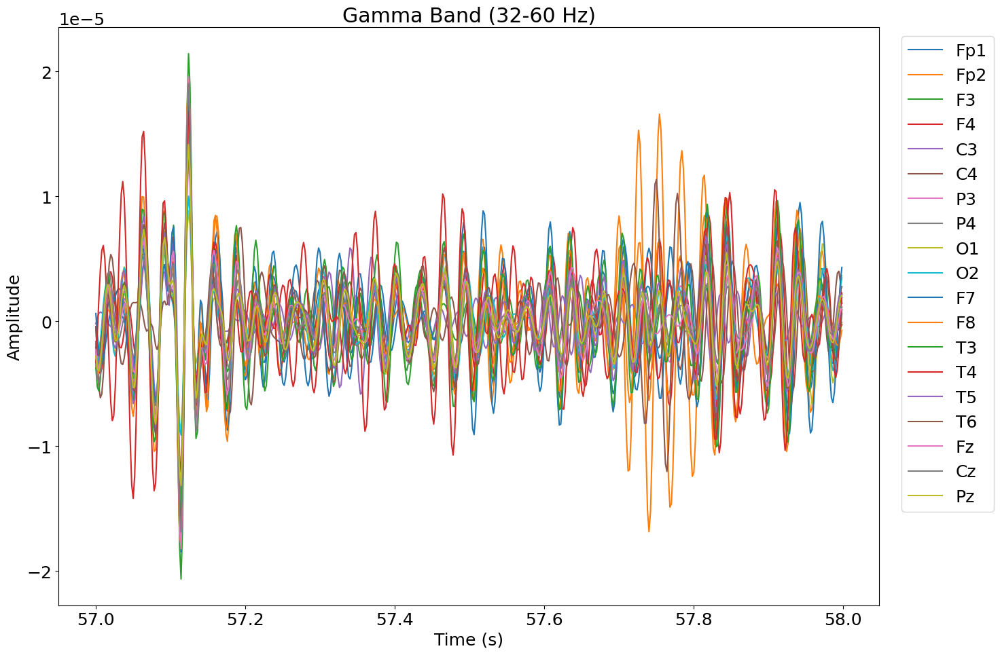

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 13 - 32 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 32.00 Hz
- Upper transition bandwidth: 8.00 Hz (-6 dB cutoff frequency: 36.00 Hz)
- Filter length: 509 samples (1.018 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


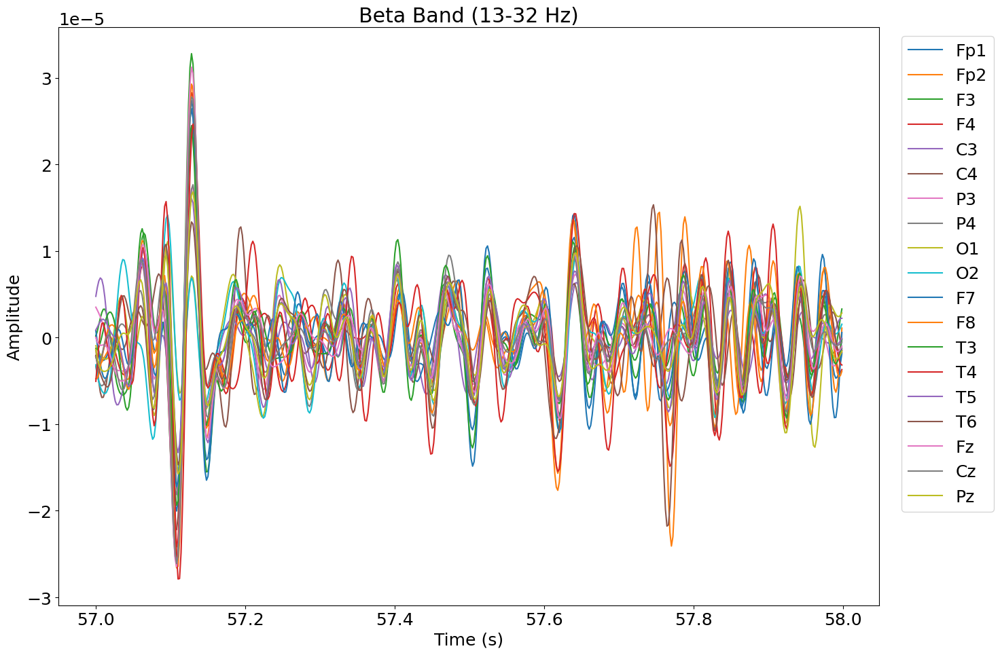

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 825 samples (1.650 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


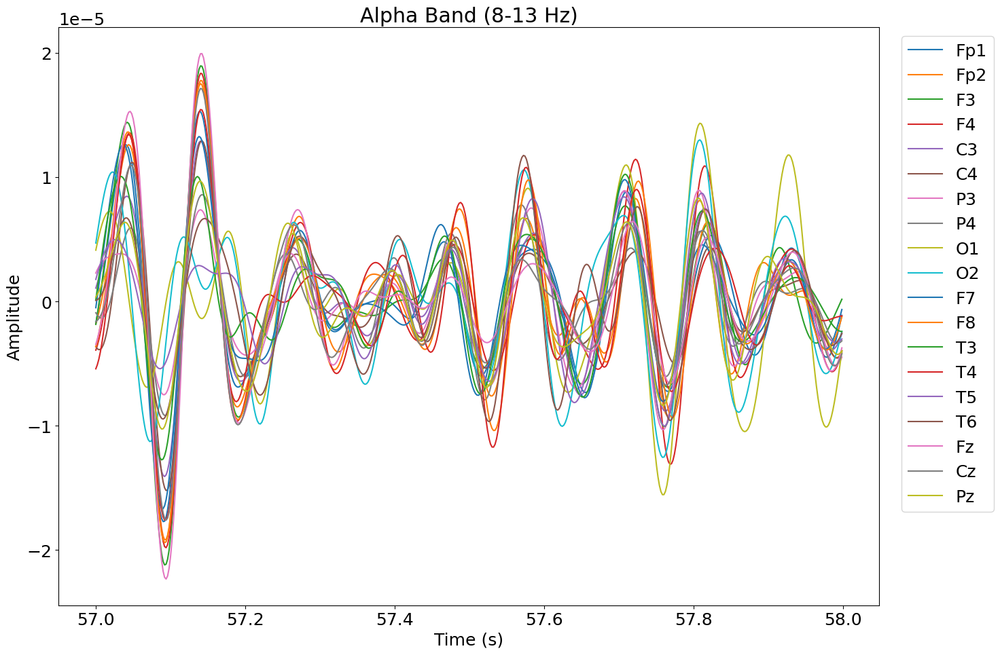

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 8 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 8.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 9.00 Hz)
- Filter length: 825 samples (1.650 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


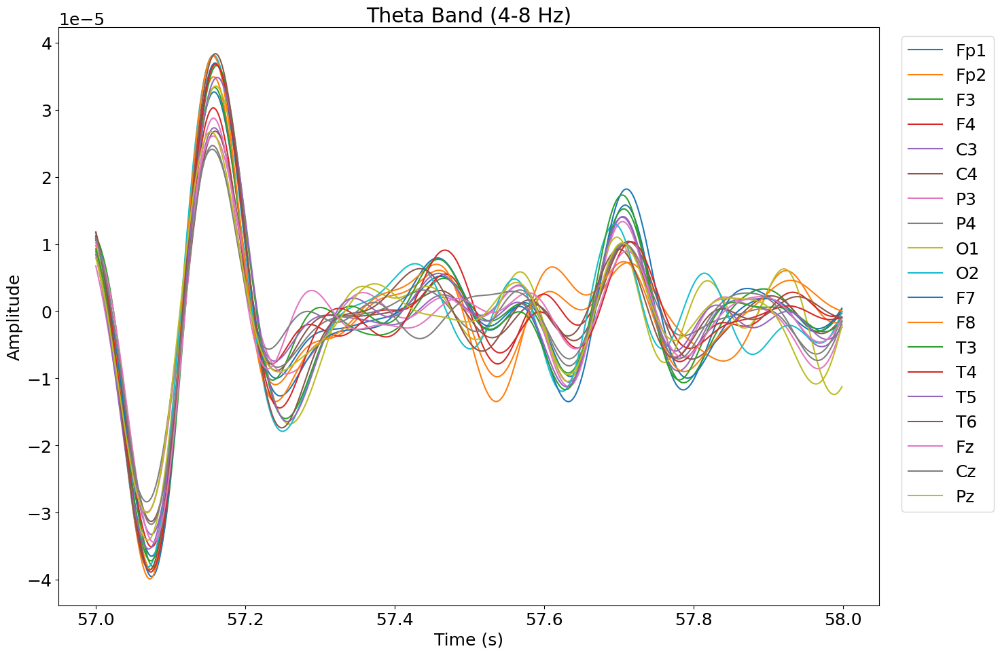

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.00 Hz)
- Filter length: 3301 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


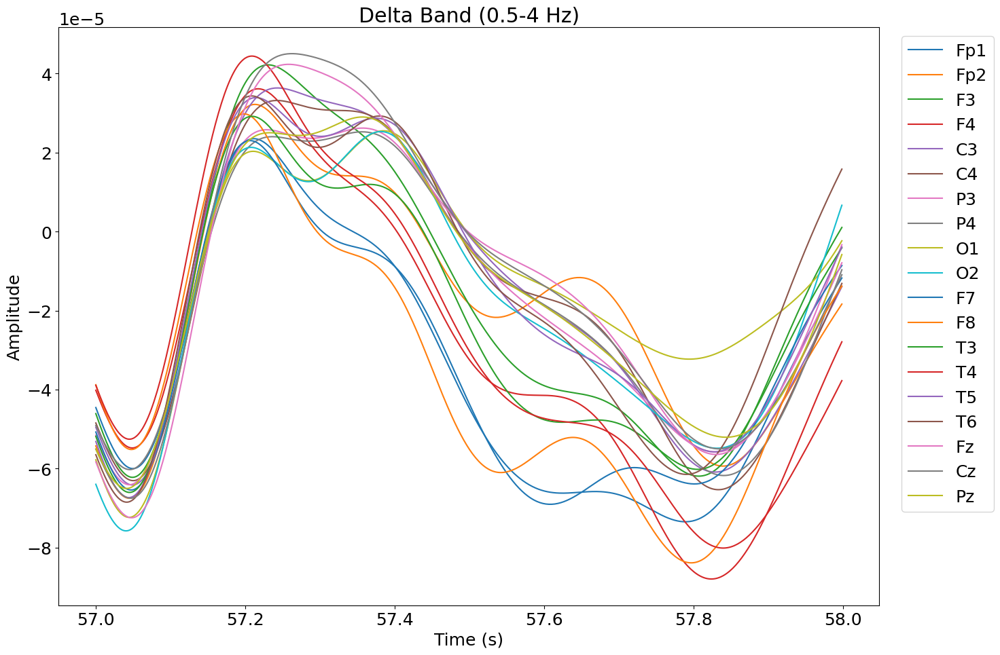

In [90]:
import mne
import numpy as np
import matplotlib.pyplot as plt
import pywt

# Cargar el archivo .set
eeg_file = 'sub-040_task-eyesclosed_eeg.set'
raw = mne.io.read_raw_eeglab(eeg_file, preload=True)

# Definir las bandas de frecuencia
bands = {
    'Gamma Band (32-60 Hz)': (32, 60),
    'Beta Band (13-32 Hz)': (13, 32),
    'Alpha Band (8-13 Hz)': (8, 13),
    'Theta Band (4-8 Hz)': (4, 8),
    'Delta Band (0.5-4 Hz)': (0.5, 4),
}

# Filtrar y plotear cada banda
for band_name, (low_freq, high_freq) in bands.items():
    # Filtrado de la banda de frecuencia
    filtered_data = raw.copy().filter(l_freq=low_freq, h_freq=high_freq)

    # Obtener los datos
    data, times = filtered_data[:, :]

    # Aplicar la transformada wavelet Daubechies 5 (db2)
    wavelet_coeffs = []
    for channel in data:
        coeffs = pywt.wavedec(channel, 'db2', level=5)
        wavelet_reconstruction = pywt.waverec(coeffs, 'db2')
        wavelet_coeffs.append(wavelet_reconstruction)

    # Convertir la lista a un array de numpy
    wavelet_coeffs = np.array(wavelet_coeffs)

    # Plotear los datos filtrados y con wavelet
    plt.figure(figsize=(15, 10))
    for i, ch_name in enumerate(raw.ch_names):
        plt.plot(times[28500:29000], wavelet_coeffs[i, 28500:29000], label=ch_name)
    plt.title(f'{band_name}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.tight_layout()
    plt.show()

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 32 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 32.00
- Lower transition bandwidth: 8.00 Hz (-6 dB cutoff frequency: 28.00 Hz)
- Upper passband edge: 60.00 Hz
- Upper transition bandwidth: 15.00 Hz (-6 dB cutoff frequency: 67.50 Hz)
- Filter length: 207 samples (0.414 s)



/var/folders/p3/57dpvzqj7qdd6ln8hb69_4d80000gn/T/ipykernel_93953/2224024886.py:8: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(eeg_file, preload=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 13 - 32 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 13.00
- Lower transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 11.38 Hz)
- Upper passband edge: 32.00 Hz
- Upper transition bandwidth: 8.00 Hz (-6 dB cutoff frequency: 36.00 Hz)
- Filter length: 509 samples (1.018 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 13 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge: 13.00 Hz
- Upper transition bandwidth: 3.25 Hz (-6 dB cutoff frequency: 14.62 Hz)
- Filter length: 825 samples (1.650 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 4 - 8 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 3.00 Hz)
- Upper passband edge: 8.0

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 4 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.00 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.00 Hz)
- Filter length: 3301 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


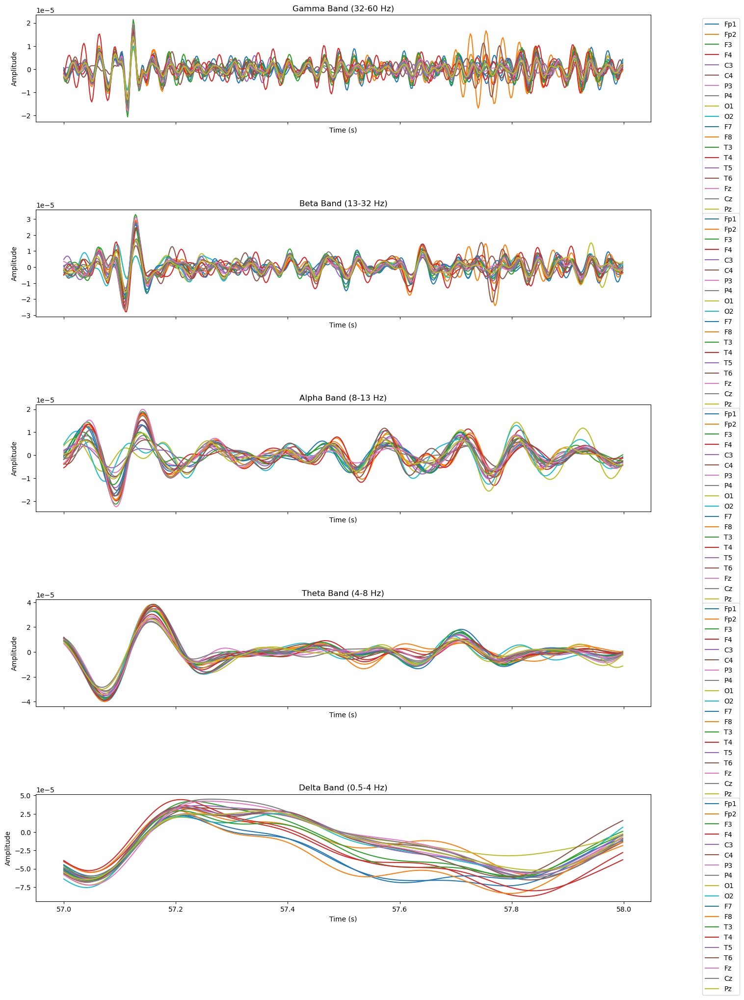

In [15]:
import mne
import numpy as np
import matplotlib.pyplot as plt
import pywt

# Cargar el archivo .set
eeg_file = 'sub-040_task-eyesclosed_eeg.set'
raw = mne.io.read_raw_eeglab(eeg_file, preload=True)

# Definir las bandas de frecuencia
bands = {
    'Gamma Band (32-60 Hz)': (32, 60),
    'Beta Band (13-32 Hz)': (13, 32),
    'Alpha Band (8-13 Hz)': (8, 13),
    'Theta Band (4-8 Hz)': (4, 8),
    'Delta Band (0.5-4 Hz)': (0.5, 4),
}

# Configurar los subplots
fig, axs = plt.subplots(len(bands), 1, figsize=(15, 20), sharex=True)

# Filtrar y plotear cada banda
for ax, (band_name, (low_freq, high_freq)) in zip(axs, bands.items()):
    # Filtrado de la banda de frecuencia
    filtered_data = raw.copy().filter(l_freq=low_freq, h_freq=high_freq)

    # Obtener los datos
    data, times = filtered_data[:, :]

    # Aplicar la transformada wavelet Daubechies 5 (db2)
    wavelet_coeffs = []
    for channel in data:
        coeffs = pywt.wavedec(channel, 'db2', level=5)
        wavelet_reconstruction = pywt.waverec(coeffs, 'db2')
        wavelet_coeffs.append(wavelet_reconstruction)

    # Convertir la lista a un array de numpy
    wavelet_coeffs = np.array(wavelet_coeffs)

    # Plotear los datos filtrados y con wavelet
    for i, ch_name in enumerate(raw.ch_names):
        ax.plot(times[28500:29000], wavelet_coeffs[i, 28500:29000], label=ch_name)
    ax.set_title(f'{band_name}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Amplitude')
    ax.legend(loc='upper right', bbox_to_anchor=(1.15, 1))

plt.tight_layout()
plt.show()

In [98]:
import numpy as np
import pywt
import mne
import pandas as pd
from scipy.signal import welch

# Función para calcular la descomposición Wavelet Daubechies db2, nivel 5
def wavelet_decomposition(signal, wavelet='db2', level=5):
    coeffs = pywt.wavedec(signal, wavelet, level=level)
    return coeffs

# Función para calcular la densidad espectral de potencia (PSD) usando el método de Welch
def psd_welch(signal, sfreq, nperseg=256):
    f, Pxx = welch(signal, sfreq, nperseg=nperseg)
    return f, Pxx

# Función para calcular la potencia relativa de banda (RBP)
def relative_band_power(signal, sfreq, band):
    f, Pxx = psd_welch(signal, sfreq)
    band_power = np.trapz(Pxx[(f >= band[0]) & (f <= band[1])])
    total_power = np.trapz(Pxx)
    return band_power / total_power

# Función para calcular características basadas en wavelets
def wavelet_features(coeffs):
    medias = [np.mean(c) for c in coeffs]
    varianzas = [np.var(c) for c in coeffs]
    return medias, varianzas

# Función para calcular características de complejidad manualmente
def complexity_features(signal, sfreq):
    f, Pxx = psd_welch(signal, sfreq)
    
    # Entropía espectral
    spectral_entropy = -np.sum(Pxx * np.log(Pxx + 1e-12))
    
    # Centroide espectral
    spectral_centroid = np.sum(f * Pxx) / np.sum(Pxx)
    
    # Rolloff espectral
    spectral_rolloff = np.percentile(f, 85)
    
    # Tasa de cruce por cero
    zero_crossing_rate = np.mean(np.diff(np.signbit(signal)))
    
    return spectral_entropy, spectral_centroid, spectral_rolloff, zero_crossing_rate

# Cargar los datos del archivo .set
file_path = 'sub-038_task-eyesclosed_eeg.set'
raw = mne.io.read_raw_eeglab(file_path)

# Extraer los datos y los nombres de los canales
data = raw.get_data()
channel_names = raw.ch_names
sfreq = raw.info['sfreq']

# Asumiendo que los nombres de los canales estándar están presentes
standard_names = [
    'Fp1', 'Fp2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2',
    'F7', 'F8', 'T7', 'T8', 'P7', 'P8'
]

# Inicializar listas para almacenar características
results = []

# Calcular las características para cada canal
for i, signal in enumerate(data):
    channel_name = channel_names[i]
    if channel_name in standard_names:
        print(f"\nCaracterísticas para {channel_name}:")

        # Descomposición Wavelet
        coeffs = wavelet_decomposition(signal)
        medias, varianzas = wavelet_features(coeffs)

        # Calcular PSD usando Welch
        f, psds = psd_welch(signal, sfreq)

        # Potencia relativa de banda (RBP)
        band_alpha = (8, 12)
        idx_band = np.logical_and(f >= band_alpha[0], f <= band_alpha[1])
        band_power = np.sum(psds[idx_band])
        total_power = np.sum(psds)
        rbp_alpha = band_power / total_power

        # Características de complejidad
        spectral_entropy, spectral_centroid, spectral_rolloff, zero_crossing_rate = complexity_features(signal, sfreq)

        # Almacenar características en la lista
        result = {
            'Channel': channel_name,
            'Mean Wavelet': medias,
            'Variance Wavelet': varianzas,
            'Relative Band Power (Alpha)': rbp_alpha,
            'Spectral Entropy': spectral_entropy,
            'Spectral Centroid': spectral_centroid,
            'Spectral Rolloff': spectral_rolloff,
            'Zero Crossing Rate': zero_crossing_rate
        }
        results.append(result)

        # Imprimir características
        print("Medias de Wavelet:", medias)
        print("Varianzas de Wavelet:", varianzas)
        print("Potencia Relativa de Banda (Alfa):", rbp_alpha)
        print("Entropía Espectral:", spectral_entropy)
        print("Centroide Espectral:", spectral_centroid)
        print("Rolloff Espectral:", spectral_rolloff)
        print("Tasa de Cruce por Cero:", zero_crossing_rate)

# Convertir los resultados a un DataFrame de pandas
df = pd.DataFrame(results)

# Guardar el DataFrame en un archivo Excel
output_file = 'caracteristicas_eeg_control2.xlsx'
df.to_excel(output_file, index=False)

print(f"Archivo Excel guardado en: {output_file}")

/var/folders/p3/57dpvzqj7qdd6ln8hb69_4d80000gn/T/ipykernel_89889/104268811.py:50: RuntimeWarning: Data will be preloaded. preload=False or a string preload is not supported when the data is stored in the .set file
/var/folders/p3/57dpvzqj7qdd6ln8hb69_4d80000gn/T/ipykernel_89889/104268811.py:50: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.



Características para Fp1:
Medias de Wavelet: [3.6296375346961034e-07, 2.6495047642329795e-08, 4.605170909254401e-08, -2.383798290569171e-09, -2.2212132154479305e-10, 1.1440165609330032e-10]
Varianzas de Wavelet: [2.8423195806339455e-08, 6.437684729530285e-10, 1.5848881050334665e-10, 2.6097573323614947e-11, 1.6517876247751264e-12, 6.389756627803742e-14]
Potencia Relativa de Banda (Alfa): 0.03480676048028677
Entropía Espectral: 3.6266622230639414e-09
Centroide Espectral: 3.842161645847507
Rolloff Espectral: 212.5
Tasa de Cruce por Cero: 0.01396906881101371

Características para Fp2:
Medias de Wavelet: [4.4284899324406606e-07, -1.254341409031019e-09, 2.714778278951485e-08, -2.3438998677948653e-09, -2.281659813996692e-10, 1.1667898299143707e-10]
Varianzas de Wavelet: [2.813000644073726e-08, 6.532096290250193e-10, 1.6774583085768535e-10, 2.7454962835053105e-11, 1.7311393038052948e-12, 6.701733762856826e-14]
Potencia Relativa de Banda (Alfa): 0.035731827614977285
Entropía Espectral: 3.61598

In [4]:
import numpy as np
import pywt
import pandas as pd
from scipy.signal import welch

# Función para calcular la descomposición Wavelet Daubechies db5, nivel 5
def wavelet_decomposition(signal, wavelet='db5', level=5):
    coeffs = pywt.wavedec(signal, wavelet, level=level)
    return coeffs

# Función para calcular la densidad espectral de potencia (PSD) usando el método de Welch
def psd_welch(signal, sfreq, nperseg=256):
    f, Pxx = welch(signal, sfreq, nperseg=nperseg)
    return f, Pxx

# Función para calcular la potencia relativa de banda (RBP)
def relative_band_power(signal, sfreq, band):
    f, Pxx = psd_welch(signal, sfreq)
    band_power = np.trapz(Pxx[(f >= band[0]) & (f <= band[1])])
    total_power = np.trapz(Pxx)
    return band_power / total_power

# Función para calcular características basadas en wavelets
def wavelet_features(coeffs):
    medias = [np.mean(c) for c in coeffs]
    varianzas = [np.var(c) for c in coeffs]
    return medias, varianzas

# Función para calcular características de complejidad manualmente
def complexity_features(signal, sfreq):
    f, Pxx = psd_welch(signal, sfreq)
    
    # Entropía espectral
    spectral_entropy = -np.sum(Pxx * np.log(Pxx + 1e-12))
    
    # Centroide espectral
    spectral_centroid = np.sum(f * Pxx) / np.sum(Pxx)
    
    # Rolloff espectral
    spectral_rolloff = np.percentile(f, 85)
    
    # Tasa de cruce por cero
    zero_crossing_rate = np.mean(np.diff(np.signbit(signal)))
    
    return spectral_entropy, spectral_centroid, spectral_rolloff, zero_crossing_rate

# Definir las bandas de frecuencia
bands = {
    'Delta': (0.5, 4),
    'Theta': (4, 8),
    'Alpha': (8, 13),
    'Beta': (13, 30),
    'Gamma': (30, 60)
}

# Cargar los datos del archivo .csv
file_path = 'OpenBCISession_ojos_abiertos_5min/EEG_ojos_cerrados.csv'
df = pd.read_csv(file_path)

# Asumir una frecuencia de muestreo
sfreq = 125  # Ajustar según tus datos

# Inicializar listas para almacenar características
results = []

# Calcular las características para cada canal
for ch in df.columns:
    signal = df[ch].values
    print(f"\nCaracterísticas para {ch}:")

    # Descomposición Wavelet
    coeffs = wavelet_decomposition(signal)
    medias, varianzas = wavelet_features(coeffs)

    # Calcular PSD usando Welch
    f, psds = psd_welch(signal, sfreq)

    # Calcular potencia relativa de bandas (RBP) para todas las bandas
    band_powers = {}
    for band_name, band_range in bands.items():
        band_power = relative_band_power(signal, sfreq, band_range)
        band_powers[f'Relative Band Power ({band_name})'] = band_power

    # Características de complejidad
    spectral_entropy, spectral_centroid, spectral_rolloff, zero_crossing_rate = complexity_features(signal, sfreq)

    # Almacenar características en la lista
    result = {
        'Channel': ch,
        'Mean Wavelet': medias,
        'Variance Wavelet': varianzas,
        'Spectral Entropy': spectral_entropy,
        'Spectral Centroid': spectral_centroid,
        'Spectral Rolloff': spectral_rolloff,
        'Zero Crossing Rate': zero_crossing_rate,
        **band_powers  # Añadir potencias relativas de bandas
    }
    results.append(result)

    # Imprimir características
    print("Medias de Wavelet:", medias)
    print("Varianzas de Wavelet:", varianzas)
    for band_name, band_power in band_powers.items():
        print(f"{band_name}: {band_power}")
    print("Entropía Espectral:", spectral_entropy)
    print("Centroide Espectral:", spectral_centroid)
    print("Rolloff Espectral:", spectral_rolloff)
    print("Tasa de Cruce por Cero:", zero_crossing_rate)

# Convertir los resultados a un DataFrame de pandas
df_features = pd.DataFrame(results)

# Guardar el DataFrame en un archivo Excel
output_file = 'caracteristicas_eeg_Sergio2.xlsx'
df_features.to_excel(output_file, index=False)

print(f"Archivo Excel guardado en: {output_file}")


Características para Ch1:
Medias de Wavelet: [-554069.5681117246, -13.69124494064876, 46.17293869740435, -12.38924492979367, -6.311382318208223, 0.36316562577253275]
Varianzas de Wavelet: [123534157.29734835, 715486.4267281686, 1226845.7007474112, 758592.5757415388, 290047.8115244785, 27040.386487125994]
Relative Band Power (Delta): 0.3272196599743076
Relative Band Power (Theta): 0.07917861934193442
Relative Band Power (Alpha): 0.040704005407292486
Relative Band Power (Beta): 0.04583499292094648
Relative Band Power (Gamma): 0.01622667522882156
Entropía Espectral: -1888701.5489592708
Centroide Espectral: 3.474378145964479
Rolloff Espectral: 53.125
Tasa de Cruce por Cero: 0.0

Características para Ch2:
Medias de Wavelet: [-569145.86426355, -13.695863254184344, 47.136921710303085, -12.667538709974615, -6.444162417673033, 0.38154536672698536]
Varianzas de Wavelet: [120158145.46333249, 732110.239106962, 1282590.387584246, 794718.3672749825, 304109.40502189664, 28281.615278653833]
Relative 

In [3]:
import numpy as np
import pywt
import mne
import pandas as pd
from scipy.signal import welch

# Función para calcular la descomposición Wavelet Daubechies db5, nivel 5
def wavelet_decomposition(signal, wavelet='db5', level=5):
    coeffs = pywt.wavedec(signal, wavelet, level=level)
    return coeffs

# Función para calcular la densidad espectral de potencia (PSD) usando el método de Welch
def psd_welch(signal, sfreq, nperseg=256):
    f, Pxx = welch(signal, sfreq, nperseg=nperseg)
    return f, Pxx

# Función para calcular la potencia relativa de banda (RBP)
def relative_band_power(signal, sfreq, band):
    f, Pxx = psd_welch(signal, sfreq)
    band_power = np.trapz(Pxx[(f >= band[0]) & (f <= band[1])])
    total_power = np.trapz(Pxx)
    return band_power / total_power

# Función para calcular características basadas en wavelets
def wavelet_features(coeffs):
    medias = [np.mean(c) for c in coeffs]
    varianzas = [np.var(c) for c in coeffs]
    return medias, varianzas

# Función para calcular características de complejidad manualmente
def complexity_features(signal, sfreq):
    f, Pxx = psd_welch(signal, sfreq)
    
    # Entropía espectral
    spectral_entropy = -np.sum(Pxx * np.log(Pxx + 1e-12))
    
    # Centroide espectral
    spectral_centroid = np.sum(f * Pxx) / np.sum(Pxx)
    
    # Rolloff espectral
    spectral_rolloff = np.percentile(f, 85)
    
    # Tasa de cruce por cero
    zero_crossing_rate = np.mean(np.diff(np.signbit(signal)))
    
    return spectral_entropy, spectral_centroid, spectral_rolloff, zero_crossing_rate

# Definir las bandas de frecuencia
bands = {
    'Delta': (0.5, 4),
    'Theta': (4, 8),
    'Alpha': (8, 13),
    'Beta': (13, 30),
    'Gamma': (30, 60)
}

# Cargar los datos del archivo .set
file_path = 'sub-002_task-eyesclosed_eeg.set'
raw = mne.io.read_raw_eeglab(file_path)

# Extraer los datos y los nombres de los canales
data = raw.get_data()
channel_names = raw.ch_names
sfreq = raw.info['sfreq']

# Inicializar listas para almacenar características
results = []

# Calcular las características para cada canal
for i, signal in enumerate(data):
    channel_name = channel_names[i]
    print(f"\nCaracterísticas para {channel_name}:")

    # Descomposición Wavelet
    coeffs = wavelet_decomposition(signal)
    medias, varianzas = wavelet_features(coeffs)

    # Calcular PSD usando Welch
    f, psds = psd_welch(signal, sfreq)

    # Calcular potencia relativa de bandas (RBP) para todas las bandas
    band_powers = {}
    for band_name, band_range in bands.items():
        band_power = relative_band_power(signal, sfreq, band_range)
        band_powers[f'Relative Band Power ({band_name})'] = band_power

    # Características de complejidad
    spectral_entropy, spectral_centroid, spectral_rolloff, zero_crossing_rate = complexity_features(signal, sfreq)

    # Almacenar características en la lista
    result = {
        'Channel': channel_name,
        'Mean Wavelet': medias,
        'Variance Wavelet': varianzas,
        'Spectral Entropy': spectral_entropy,
        'Spectral Centroid': spectral_centroid,
        'Spectral Rolloff': spectral_rolloff,
        'Zero Crossing Rate': zero_crossing_rate,
        **band_powers  # Añadir potencias relativas de bandas
    }
    results.append(result)

    # Imprimir características
    print("Medias de Wavelet:", medias)
    print("Varianzas de Wavelet:", varianzas)
    for band_name, band_power in band_powers.items():
        print(f"{band_name}: {band_power}")
    print("Entropía Espectral:", spectral_entropy)
    print("Centroide Espectral:", spectral_centroid)
    print("Rolloff Espectral:", spectral_rolloff)
    print("Tasa de Cruce por Cero:", zero_crossing_rate)

# Convertir los resultados a un DataFrame de pandas
df_features = pd.DataFrame(results)

# Guardar el DataFrame en un archivo Excel
output_file = 'caracteristicas_eeg_AD3_all_bands.xlsx'
df_features.to_excel(output_file, index=False)

print(f"Archivo Excel guardado en: {output_file}")

/var/folders/p3/57dpvzqj7qdd6ln8hb69_4d80000gn/T/ipykernel_93953/1594280034.py:59: RuntimeWarning: Data will be preloaded. preload=False or a string preload is not supported when the data is stored in the .set file
  raw = mne.io.read_raw_eeglab(file_path)



Características para Fp1:
Medias de Wavelet: [8.37418781707194e-08, 1.5915784315204497e-07, -2.553016952034001e-08, -2.0735387875449578e-10, -4.632100238581e-11, -9.624845375344015e-13]
Varianzas de Wavelet: [2.964696488865193e-08, 8.883138445182797e-10, 1.895582692668325e-10, 4.877296956803699e-11, 7.761284299171101e-13, 1.0346700667173949e-15]
Relative Band Power (Delta): 0.35721938342921283
Relative Band Power (Theta): 0.059463936879158345
Relative Band Power (Alpha): 0.025380363051618213
Relative Band Power (Beta): 0.043628078124128604
Relative Band Power (Gamma): 0.019313831893029928
Entropía Espectral: 3.906133880219193e-09
Centroide Espectral: 4.662302429905325
Rolloff Espectral: 212.5
Tasa de Cruce por Cero: 0.016204806972152243

Características para Fp2:
Medias de Wavelet: [5.183970242963899e-08, 1.4925772017037066e-07, -3.4167210618393296e-08, -1.850931717815192e-10, -4.613902951351829e-11, -9.77649439760513e-13]
Varianzas de Wavelet: [2.9501288338158303e-08, 9.3706658524268